In [1]:
# from regelum.scenario import Scenario
from regelum.simulator import CasADi
import numpy as np

from regelum.utils import rg
from regelum.model import ModelWeightContainer
# Max Iteration count may be added in opt_options={"print_level": 0, "max_iter": MAX_ITER},
from regelum.optimizable.core.configs import CasadiOptimizerConfig
from regelum.predictor import EulerPredictor
from regelum.objective import RunningObjective
from regelum.critic import CriticTrivial
from regelum.scenario import RLScenario
from regelum.event import Event

import sys
sys.path.append('../')

from src.system import HydraulicSystem, StationaryHydraulicSystem
from src.observer import StationaryHydraulicObserver
from src.objective import HydraulicObjectiveModel
from src.policy import MPC
from src.animation import HydraylicAnimation

import random

random.seed(44)

In [2]:
from regelum.callback import (
    ScenarioStepLogger,
    # StateTracker,
    # HistoricalDataCallback,
)
from src.callback import HistoricalDataCallback, SimulatorStepLogger

from regelum import set_ipython_env
%matplotlib inline
callbacks = [SimulatorStepLogger, ScenarioStepLogger, HistoricalDataCallback]
ScenarioStepLogger.cooldown = 0.01
callbacks = set_ipython_env(callbacks=callbacks, interactive=True)

In [3]:
MAX_STEP = 1e-7
PREDICTION_HORIZON = 5
FINAL_TIME = 10e-3
SAMPLING_TIME = 1e-3
ACTION_SIZE = 1

pred_step_size = 1 * SAMPLING_TIME

# Define the initial state
p_atm = 1e5
initial_state = rg.array([1e3, 0, 0, p_atm, p_atm])

model = ModelWeightContainer(
    dim_output=ACTION_SIZE, 
    weights_init=rg.zeros((PREDICTION_HORIZON + 1, ACTION_SIZE), rc_type=rg.CASADI)
)  # A trivial model contains our predicted actions

# system = HydraulicSystem(
#     init_state=initial_state
# )

# # Update observation noize std
# system.update_system_parameters(
#     {
#         "jet_length_std": 2e-1, # Was 10e-2
#         "jet_velocity_std": 1e-1, # Was 2e-2
#     }
# )

system = HydraulicSystem(
    init_state=initial_state,
    system_parameters_init = {
            "p_l_gauge": 1.5e5,
            "x_th_limits": (0., 20.),
            "freq_th": 500.0,
            "m_p": 20e-3,
            "D_th": 200e-6, # WAS 200e-6, then 5e-3
            "D_hydr": 20e-3,
            "D_work": 20e-3,
            "h_work_init": 1e3,
            "D_exit": 0.33e-3,
            "l_exit": 8.5e-3,
            "p_coulomb": 10e3, # WAS 10e3, then 1e3
            "eta": 0.70,
            "zeta_th": 5.0, # WAS 5.0, then 0.1
            "rho_hydr": 1e3,
            "rho_work": 1e3,
            "beta_v_hydr": 0.49e-9,
            "beta_v_work": 0.49e-9,
            "sigma_work": 73e-3,
            "mu_work": 1.0e-3,
            "v_j": 200.,
            "jet_length_std": 1e-1, # Was 10e-2
            "jet_velocity_std": 10, # Was 2e-2
            "pressure_std": 0.,
            "p_atm": 1e5, # Atmosphere (ambient) pressure, Pa
            "g": 9.81, # gravity constant, m/s^2
        },
)


system_model = StationaryHydraulicSystem(
    init_state=initial_state
)
observer = StationaryHydraulicObserver(
    system=system_model
)
predictor = EulerPredictor(
    system=system_model, pred_step_size=pred_step_size
)  # Predictor is used for MPC-prediction

# RUNNING OBJECTIVE
running_objective_model = HydraulicObjectiveModel(
    system=system_model,
    quad_matrix_type="diagonal", weights=[1, 0, 0]
)  # A quadratic model for running (a.k.a. instant) objective
running_objective = RunningObjective(
    model=running_objective_model
)  # Wrap `running_objective_model` into `RunningObjective` class

# Update observation noize std
system.update_system_parameters(
    {
        "jet_length_std": 5e-2, # Was 10e-2
        "jet_velocity_std": 10, # Was 2e-2
    }
)

system_model.update_system_parameters(
    {
        "jet_length_std": 1e-1, # Was 10e-2
        "jet_velocity_std": 10, # Was 2e-2
    }
)

simulator = CasADi(
    system=system,
    state_init=initial_state,
    action_init=rg.array([0]),
    time_final=FINAL_TIME,
    max_step=MAX_STEP,
)

scenario = RLScenario(
    policy=MPC(
        model=model,
        system=system_model,
        action_bounds=system_model.action_bounds,
        optimizer_config=CasadiOptimizerConfig(),
        prediction_horizon=PREDICTION_HORIZON,
        running_objective=running_objective,
        predictor=predictor
    ),
    observer = observer,
    critic=CriticTrivial(),  # mocked critic
    running_objective=running_objective,
    policy_optimization_event=Event.compute_action,  # run policy optimization on each step
    discount_factor=1.0,
    sampling_time=SAMPLING_TIME,
    simulator=simulator,
    N_episodes=1,
    N_iterations=1,
)

scenario.run()


******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit https://github.com/coin-or/Ipopt
******************************************************************************



[01:40:03] INFO     runn. objective: 3.69, state est.: [1000.      4.69    0.31], observation: [   ]8;id=185247;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=398006;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    0.   17.21], action: [20.], value: 0.0037, time: 0.0000 (0.0%), episode: 1/1,                  
                    iteration: 1/1                                                                                 

[01:40:20] INFO     runn. objective: 3.29, state est.: [1000.03  116.1     7.75], observation: [   ]8;id=122316;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=596313;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    0.11 426.44], action: [20.], value: 0.0070, time: 0.0010 (10.0%), episode:                     
                    1/1, iteration: 1/1                                                                            

[01:40:37] INFO     runn. objective: 1.26, state est.: [1000.22  190.2    12.71], observation: [   ]8;id=538667;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=722279;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    0.8  698.61], action: [2.66], value: 0.0082, time: 0.0020 (20.0%), episode:                    
                    1/1, iteration: 1/1                                                                            

[01:40:57] INFO     runn. objective: 0.55, state est.: [1000.32  130.04    8.68], observation: [   ]8;id=619705;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=424723;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    1.18 477.65], action: [0.93], value: 0.0088, time: 0.0030 (30.0%), episode:                    
                    1/1, iteration: 1/1                                                                            

[01:41:19] INFO     runn. objective: 0.02, state est.: [1000.48   83.84    5.59], observation: [   ]8;id=375688;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=77126;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    1.77 307.96], action: [-8.59], value: 0.0088, time: 0.0040 (40.0%), episode:                   
                    1/1, iteration: 1/1                                                                            

[01:41:44] INFO     runn. objective: 0.00, state est.: [1000.52    0.2     0.01], observation:     ]8;id=166774;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=117450;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    [1.92 0.73], action: [0.33], value: 0.0088, time: 0.0050 (50.0%), episode:                     
                    1/1, iteration: 1/1                                                                            

[01:42:12] INFO     runn. objective: 0.00, state est.: [1000.51    1.74    0.12], observation:     ]8;id=283117;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=330750;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    [1.88 6.38], action: [1.24], value: 0.0088, time: 0.0060 (60.0%), episode:                     
                    1/1, iteration: 1/1                                                                            

[01:42:42] INFO     runn. objective: 0.02, state est.: [1000.56    7.18    0.48], observation: [   ]8;id=303779;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=36703;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    2.06 26.37], action: [-0.93], value: 0.0088, time: 0.0070 (70.0%), episode:                    
                    1/1, iteration: 1/1                                                                            

[01:43:14] INFO     runn. objective: 0.01, state est.: [1000.54    3.91    0.26], observation: [   ]8;id=499233;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=961428;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    2.   14.36], action: [-3.48], value: 0.0088, time: 0.0080 (80.0%), episode:                    
                    1/1, iteration: 1/1                                                                            

[01:43:48] INFO     runn. objective: 0.00, state est.: [1000.53   -1.7    -0.11], observation: [   ]8;id=783408;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=260009;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    1.93 -6.24], action: [-0.], value: 0.0088, time: 0.0090 (90.0%), episode: 1/1,                 
                    iteration: 1/1                                                                                 

[01:44:26] INFO     runn. objective: 0.02, state est.: [1000.56   -6.9    -0.43], observation: [   ]8;id=856377;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=712886;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    2.05 -25.36], action: [-0.], value: 0.0089, time: 0.0100 (100.0%), episode:                    
                    1/1, iteration: 1/1                                                                            

,time,running_objective,current_value,episode_id,iteration_id,throttle action [µm],jet length [mm],jet velocity [mm/s],piston position [µm],piston velocity [µm/s],throttle position [µm]
0,0.000000,3.693791,0.003694,1,1,20.000000,0.004379,17.213153,1000.001192,4.686281,0.312420
1,0.001000,3.288929,0.006983,1,1,20.000000,0.112763,426.437765,1000.030700,116.097681,7.746635
2,0.002000,1.257964,0.008241,1,1,2.657639,0.804713,698.612302,1000.219083,190.197199,12.709696
3,0.003000,0.551054,0.008792,1,1,0.932019,1.183973,477.654235,1000.322337,130.041365,8.678965
4,0.004000,0.023209,0.008815,1,1,-8.592126,1.773957,307.960348,1000.482960,83.842205,5.592040
5,0.005000,0.000106,0.008815,1,1,0.333055,1.916026,0.734774,1000.521638,0.200042,0.013336
6,0.006000,0.001908,0.008817,1,1,1.238357,1.882619,6.379907,1000.512543,1.736930,0.115796
7,0.007000,0.017867,0.008835,1,1,-0.934969,2.059969,26.365736,1000.560826,7.178072,0.478541
8,0.008000,0.005525,0.008840,1,1,-3.475800,2.000631,14.361043,1000.544672,3.909794,0.260654
9,0.009000,0.000020,0.008840,1,1,-0.000018,1.930797,-6.239736,1000.525659,-1.698768,-0.105966


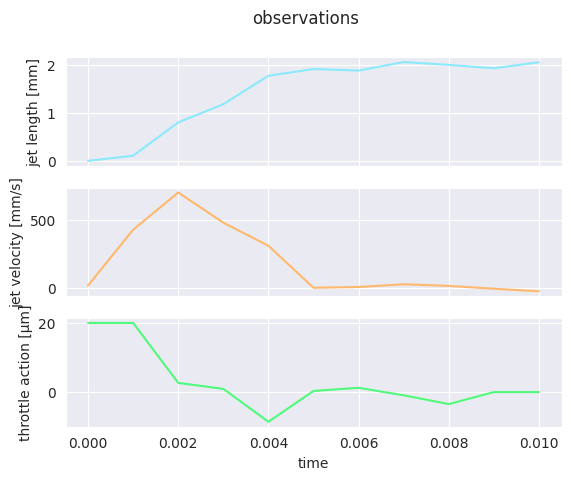

In [4]:
display(callbacks[-1].data)
callbacks[-1].plot(name="observations");

In [5]:
display(callbacks[0].data)

,time,jet length [mm],jet velocity [mm/s],piston position [µm],piston velocity [µm/s],throttle position [µm],hydraulic pressure [Pa],working pressure [Pa]
0,0.000000e+00,0.000000,0.000000,1000.000000,0.000000,0.000000,100000.000000,100000.000000
1,1.000000e-07,0.000000,0.000000,1000.000000,0.000000,0.001000,100000.001581,100000.000000
2,2.000000e-07,0.000000,0.000000,1000.000000,0.000000,0.002000,100000.006323,100000.000000
3,3.000000e-07,0.000000,0.000000,1000.000000,0.000000,0.003000,100000.014227,100000.000000
4,4.000000e-07,0.000000,0.000000,1000.000000,0.000000,0.004000,100000.025291,100000.000000
...,...,...,...,...,...,...,...,...
99997,9.999700e-03,1.947949,1.280057,1000.530329,0.348496,-1.751492,108160.584931,100000.003801
99998,9.999800e-03,1.947949,1.963269,1000.530329,0.534500,-1.751492,108160.526916,100000.004924
99999,9.999900e-03,1.947949,2.646128,1000.530329,0.720408,-1.751492,108160.473691,100000.001486
100000,1.000000e-02,1.947949,0.443799,1000.530329,0.120824,-1.751492,108160.411925,100000.000434


## Display data and animation

In [6]:
state_trajectory = callbacks[0].data
observations = callbacks[-1].data
display(observations)
# callbacks[-1].plot(name="observations"); # Replace plot to own plot function!

# Clean callback
callbacks[0].reset()
callbacks[-1].clear_recent_data()

,time,running_objective,current_value,episode_id,iteration_id,throttle action [µm],jet length [mm],jet velocity [mm/s],piston position [µm],piston velocity [µm/s],throttle position [µm]
0,0.000000,3.693791,0.003694,1,1,20.000000,0.004379,17.213153,1000.001192,4.686281,0.312420
1,0.001000,3.288929,0.006983,1,1,20.000000,0.112763,426.437765,1000.030700,116.097681,7.746635
2,0.002000,1.257964,0.008241,1,1,2.657639,0.804713,698.612302,1000.219083,190.197199,12.709696
3,0.003000,0.551054,0.008792,1,1,0.932019,1.183973,477.654235,1000.322337,130.041365,8.678965
4,0.004000,0.023209,0.008815,1,1,-8.592126,1.773957,307.960348,1000.482960,83.842205,5.592040
5,0.005000,0.000106,0.008815,1,1,0.333055,1.916026,0.734774,1000.521638,0.200042,0.013336
6,0.006000,0.001908,0.008817,1,1,1.238357,1.882619,6.379907,1000.512543,1.736930,0.115796
7,0.007000,0.017867,0.008835,1,1,-0.934969,2.059969,26.365736,1000.560826,7.178072,0.478541
8,0.008000,0.005525,0.008840,1,1,-3.475800,2.000631,14.361043,1000.544672,3.909794,0.260654
9,0.009000,0.000020,0.008840,1,1,-0.000018,1.930797,-6.239736,1000.525659,-1.698768,-0.105966


In [7]:
l_crit = system._parameters["l_crit"]
D_drop = system._parameters["D_drop"]
D_exit = system._parameters["D_exit"]*1e3
D_drop_rel = D_drop/D_exit

anim_cl = HydraylicAnimation(
    state_trajectory, 
    observations, 
    l_crit, 
    D_drop_rel
)
anim_cl.animate_system(interacitve=True)

           INFO     Animation.save using <class 'matplotlib.animation.HTMLWriter'>                ]8;id=772848;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/matplotlib/animation.py\animation.py]8;;\:]8;id=885475;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/matplotlib/animation.py#1060\1060]8;;\

Once 
 
 Loop 
 
 Reflect

Save results

In [8]:
anim_cl = HydraylicAnimation(
    state_trajectory, 
    observations, 
    l_crit, 
    D_drop_rel
)
# save animation
anim_cl.animate_system(save_gif=True, gif_filename = '../results/system_animation_mpc_noize.gif')
# save last frame
anim_cl.save_last_frame('../results/system_last_observation_mpc_noize.pdf')

[01:46:38] INFO     Animation.save using <class 'matplotlib.animation.PillowWriter'>              ]8;id=870823;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/matplotlib/animation.py\animation.py]8;;\:]8;id=493751;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/matplotlib/animation.py#1060\1060]8;;\